<a href="https://colab.research.google.com/github/kumarshankar/Autopilot/blob/master/venus_volcanoes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install kaggle

    100% |████████████████████████████████| 61kB 3.5MB/s 
    100% |████████████████████████████████| 235kB 7.1MB/s 
  Running setup.py bdist_wheel for kaggle ... - \ done
  Stored in directory: /root/.cache/pip/wheels/8b/21/3b/a0076243c6ae12a6215b2da515fe06b539aee7217b406e510e
  Running setup.py bdist_wheel for python-slugify ... - done
  Stored in directory: /root/.cache/pip/wheels/e3/65/da/2045deea3098ed7471eca0e2460cfbd3fdfe8c1d6fa6fcac92
Successfully built kaggle python-slugify


In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import Lasso

In [3]:
os.listdir()

['sample_data', '.config']

In [4]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"shankarkumar","key":"c8fc1f05bf6c97e80ff6ee9b970d0915"}'}

In [0]:
! mkdir -p ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [6]:
os.listdir()

['sample_data', '.config', 'kaggle.json']

In [7]:
!kaggle datasets download -d fmena14/volcanoesvenus

 99% 108M/109M [00:00<00:00, 109MB/s]  
100% 109M/109M [00:00<00:00, 142MB/s]


In [8]:
#unzip train and test files
!unzip volcanoesvenus.zip

Archive:  volcanoesvenus.zip
  inflating: Volcanoes_train.tar.gz  
  inflating: Volcanoes_test.tar.gz   


In [9]:
os.listdir()

['sample_data',
 '.config',
 'Volcanoes_test.tar.gz',
 'volcanoesvenus.zip',
 'kaggle.json',
 'Volcanoes_train.tar.gz']

In [0]:
import tarfile
fname="Volcanoes_train.tar.gz"
if (fname.endswith("tar.gz")):
    tar = tarfile.open(fname, "r:gz")
    tar.extractall()
    tar.close()
elif (fname.endswith("tar")):
    tar = tarfile.open(fname, "r:")
    tar.extractall()
    tar.close()

In [11]:
os.listdir()

['sample_data',
 '.config',
 'Volcanoes_test.tar.gz',
 'volcanoesvenus.zip',
 'train_images.csv',
 'train_labels.csv',
 'kaggle.json',
 'Volcanoes_train.tar.gz']

In [0]:
fname="Volcanoes_test.tar.gz"
if (fname.endswith("tar.gz")):
    tar = tarfile.open(fname, "r:gz")
    tar.extractall()
    tar.close()
elif (fname.endswith("tar")):
    tar = tarfile.open(fname, "r:")
    tar.extractall()
    tar.close()

In [13]:
os.listdir()

['sample_data',
 '.config',
 'Volcanoes_test.tar.gz',
 'test_labels.csv',
 'volcanoesvenus.zip',
 'test_images.csv',
 'train_images.csv',
 'train_labels.csv',
 'kaggle.json',
 'Volcanoes_train.tar.gz']

In [0]:
train_images = pd.read_csv("train_images.csv")
train_labels = pd.read_csv("train_labels.csv")
test_images = pd.read_csv("test_images.csv")
test_labels = pd.read_csv("test_labels.csv")

In [15]:
train_labels.shape

(7000, 4)

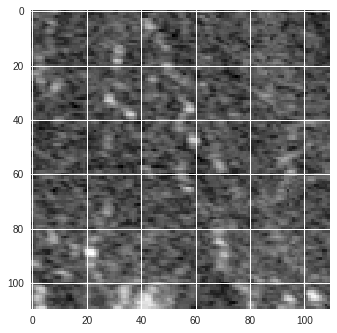

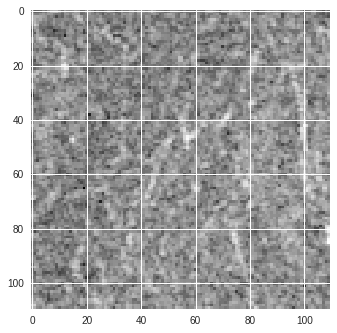

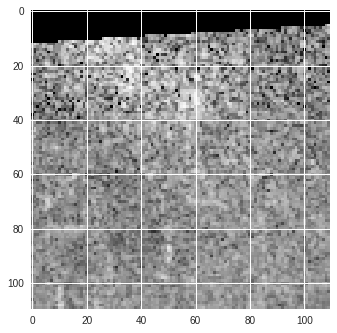

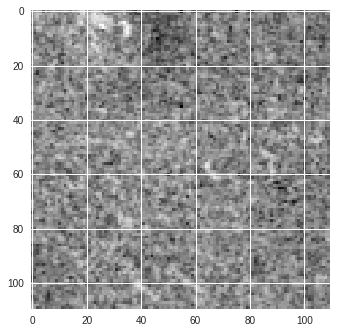

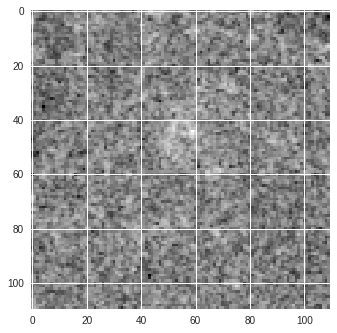

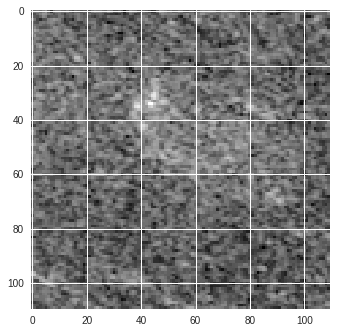

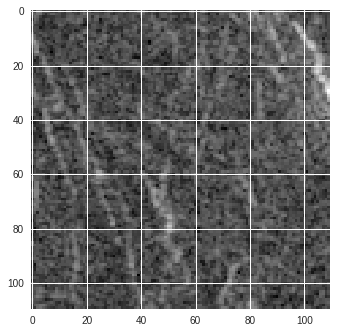

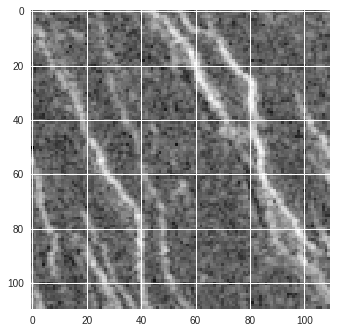

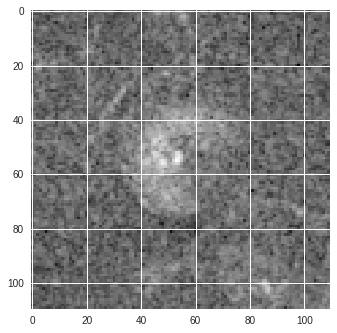

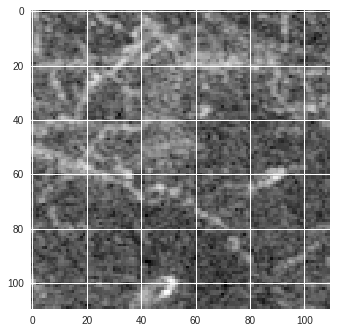

In [0]:
for i in range(10):
    row = np.array(train_images.iloc[i])
    image = row.reshape(110,110)
    plt.figure()
    plt.imshow(image,cmap='gray')

In [16]:
print(sum(train_images.isna().sum()))
print(sum(test_images.isna().sum()))

print(train_labels.isna().sum())
print(test_labels.isna().sum())

0
0
Volcano?               0
Type                6000
Radius              6000
Number Volcanoes    6000
dtype: int64
Volcano?               0
Type                2300
Radius              2300
Number Volcanoes    2300
dtype: int64


In [17]:
print(train_labels.head(15))

    Volcano?  Type  Radius  Number Volcanoes
0          1   3.0   17.46               1.0
1          0   NaN     NaN               NaN
2          0   NaN     NaN               NaN
3          0   NaN     NaN               NaN
4          0   NaN     NaN               NaN
5          0   NaN     NaN               NaN
6          0   NaN     NaN               NaN
7          0   NaN     NaN               NaN
8          0   NaN     NaN               NaN
9          1   1.0   22.02               1.0
10         0   NaN     NaN               NaN
11         0   NaN     NaN               NaN
12         0   NaN     NaN               NaN
13         0   NaN     NaN               NaN
14         0   NaN     NaN               NaN


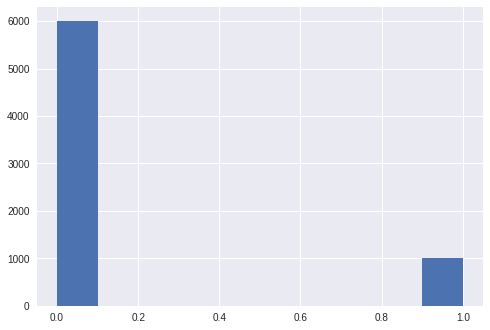

In [18]:
plt.hist(train_labels["Volcano?"])
plt.show()

In [0]:
train_labels.fillna(value=0,inplace=True)
test_labels.fillna(value=0,inplace=True)

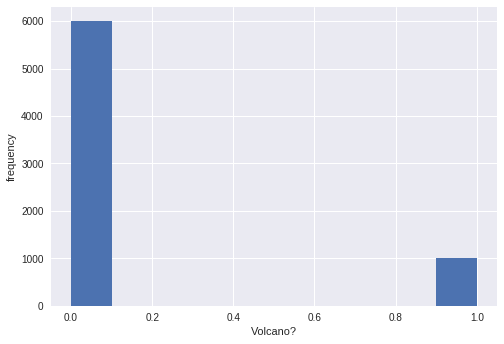

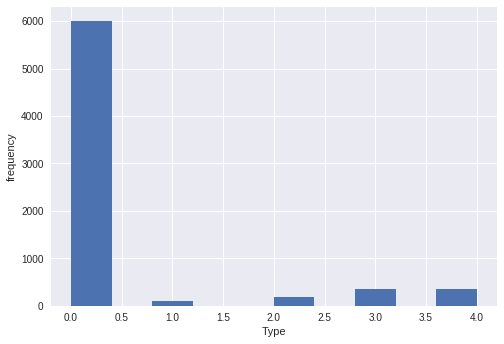

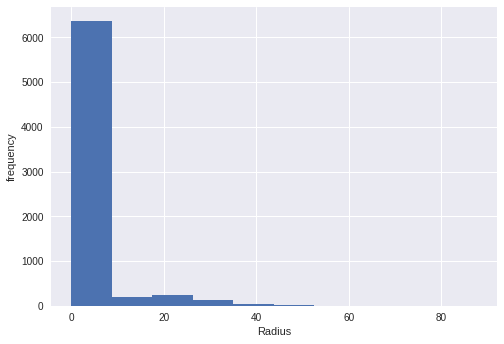

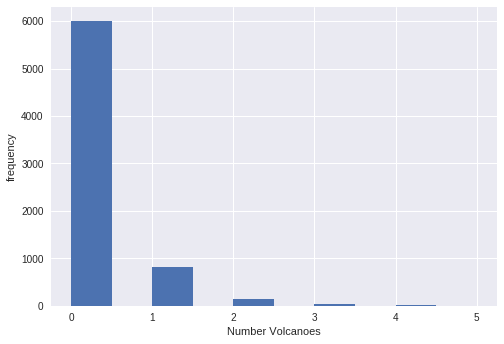

In [18]:
for x in train_labels.keys():
    X = train_labels[x]
    plt.figure()
    plt.hist(X)
    plt.xlabel(x)
    plt.ylabel("frequency")
plt.show()

In [20]:
print(train_images.shape)
print(train_labels.shape)

print(test_images.shape)
print(test_labels.shape)

(6999, 12100)
(7000, 4)
(2733, 12100)
(2734, 4)


In [20]:
print(train_images.head())
print(test_images.head())

    95  101   99  103  95.1   86   96   89   70  104   ...    111.214  \
0   91   92   91   89    92   93   96  101  107  104   ...        103   
1   87   70   72   74    84   78   93  104  106  106   ...         84   
2    0    0    0    0     0    0    0    0    0    0   ...         94   
3  114  118  124  119    95  118  105  116  123  112   ...        116   
4   79   95   90   82    73   74   77   75   82   87   ...         90   

   107.329  92.354  89.258  103.379  99.414  117.112  116.103  118.82  96.423  
0       92      93      95       98     105      104      100      90      81  
1       71      95     102       94      80       91       80      84      90  
2       81      89      84       80      90       92       80      88      96  
3      113     102      93      109     104      106      117     111     115  
4       80      79      78       65      71       62       97      89      73  

[5 rows x 12100 columns]
   107  116  108  101  107.1  109  108.1  110  100  109

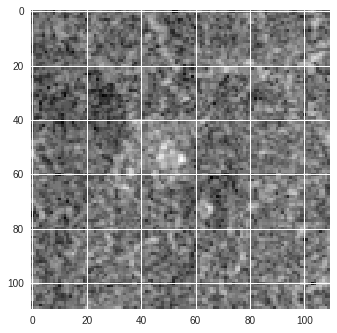

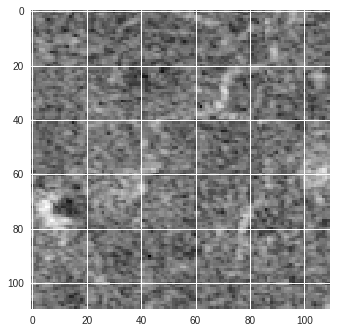

In [21]:
columns = list(train_images.columns)
columns = [float(x) for x in columns]
train_first_row = np.round(columns).astype(np.int64)
image = train_first_row.reshape(110,110)
plt.imshow(image,cmap='gray')

columns = list(test_images.columns)
columns = [float(x) for x in columns]
test_first_row = np.round(columns).astype(np.int64)
image = test_first_row.reshape(110,110)
plt.figure()
plt.imshow(image,cmap='gray')

plt.show()

In [0]:
train_images.loc[-1] = train_first_row
train_images.index += 1
train_images.sort_index(inplace=True)

test_images.loc[-1] = test_first_row
test_images.index += 1
test_images.sort_index(inplace=True)

In [31]:
print(train_images.shape)
print(train_labels.shape)
print(test_images.shape)
print(test_labels.shape)
print(train_images.index)
print(train_labels.index)
print(test_images.index)
print(test_labels.index)

(7000, 12100)
(7000, 4)
(2734, 12100)
(2734, 4)
RangeIndex(start=0, stop=7000, step=1)
RangeIndex(start=0, stop=7000, step=1)
RangeIndex(start=0, stop=2734, step=1)
RangeIndex(start=0, stop=2734, step=1)


In [0]:
train_images.index = pd.RangeIndex(start=0,stop=7000, step=1)
test_images.index = pd.RangeIndex(start=0,stop=2734, step=1)

In [32]:
print(train_images.shape)
print(train_labels.shape)

(7000, 12100)
(7000, 4)


In [33]:
X_train = np.array(train_images)
y_train = np.array(train_labels.drop(['Radius'],1))
X_test = np.array(test_images)
y_test = np.array(test_labels.drop(['Radius'],1))

clf = DecisionTreeClassifier()
clf.fit(X_train,y_train)

pred = clf.predict(X_test)
predclf = pd.DataFrame(pred)

predclf.columns = ['Volcano?','Type','Number Volcanoes']

print(predclf.head())

   Volcano?  Type  Number Volcanoes
0       0.0   0.0               0.0
1       0.0   0.0               0.0
2       1.0   3.0               2.0
3       0.0   0.0               0.0
4       1.0   2.0               1.0


In [34]:
new_train_data = train_images[(train_labels['Volcano?'] == 1)].join(train_labels[(train_labels['Volcano?'] == 1)].drop(['Radius','Volcano?'],1))
new_train_labels = train_labels['Radius'][(train_labels['Volcano?'] == 1)]

new_test_data = test_images[(predclf['Volcano?'] == 1)].join(predclf[(predclf['Volcano?'] == 1)].drop(['Volcano?'],1))
new_test_labels = test_labels['Radius'][(predclf['Volcano?'] == 1)]

X_train = np.array(new_train_data)
y_train = np.array(new_train_labels)

X_test = np.array(new_test_data)
y_test = np.array(new_test_labels)

reg = Lasso()
reg.fit(X_train,y_train)

pred = reg.predict(X_test)
predreg = pd.DataFrame(pred)

predreg.columns = ['Radius']

print(predreg.head())

      Radius
0  26.486052
1  20.137682
2  22.108023
3   6.814690
4  17.444549


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


In [35]:
pred_radius = []
y = 0
for x in range(predclf.shape[0]):
    if predclf['Volcano?'].iloc[x] == 1.0:
        pred_radius.append(predreg['Radius'].iloc[y])
        y+=1
    else:
        pred_radius.append(0.)

pred_radius = pd.DataFrame({'Radius': pred_radius})

total_pred = predclf.join(pred_radius)

print(total_pred.head())

   Volcano?  Type  Number Volcanoes     Radius
0       0.0   0.0               0.0   0.000000
1       0.0   0.0               0.0   0.000000
2       1.0   3.0               2.0  26.486052
3       0.0   0.0               0.0   0.000000
4       1.0   2.0               1.0  20.137682


In [36]:
cols = ['Volcano?','Type','Radius','Number Volcanoes']
total_pred = total_pred[cols]

print(total_pred)

      Volcano?  Type     Radius  Number Volcanoes
0          0.0   0.0   0.000000               0.0
1          0.0   0.0   0.000000               0.0
2          1.0   3.0  26.486052               2.0
3          0.0   0.0   0.000000               0.0
4          1.0   2.0  20.137682               1.0
5          0.0   0.0   0.000000               0.0
6          0.0   0.0   0.000000               0.0
7          0.0   0.0   0.000000               0.0
8          0.0   0.0   0.000000               0.0
9          0.0   0.0   0.000000               0.0
10         0.0   0.0   0.000000               0.0
11         0.0   0.0   0.000000               0.0
12         0.0   0.0   0.000000               0.0
13         0.0   0.0   0.000000               0.0
14         0.0   0.0   0.000000               0.0
15         0.0   0.0   0.000000               0.0
16         0.0   0.0   0.000000               0.0
17         0.0   0.0   0.000000               0.0
18         0.0   0.0   0.000000               0.0


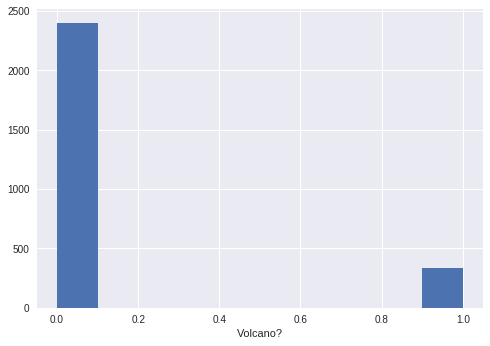

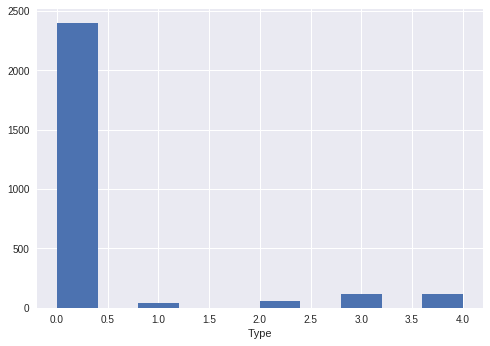

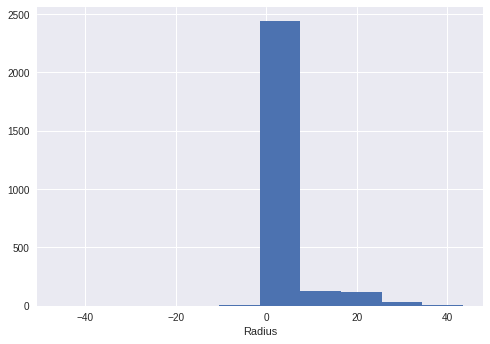

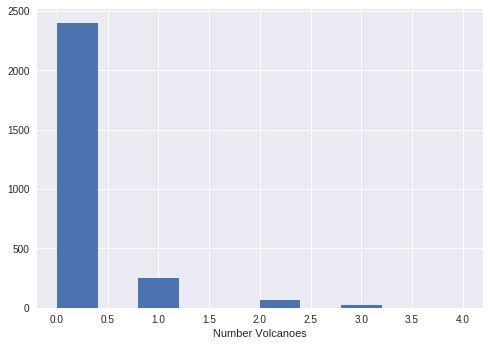

In [37]:
for x in total_pred.keys():
    X = total_pred[x]
    plt.figure()
    plt.hist(X)
    plt.xlabel(x)
plt.show()

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


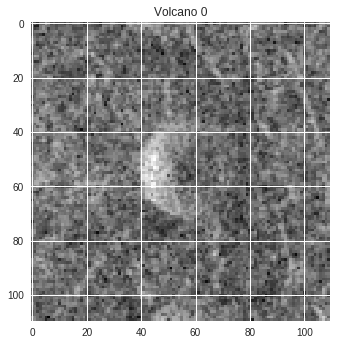

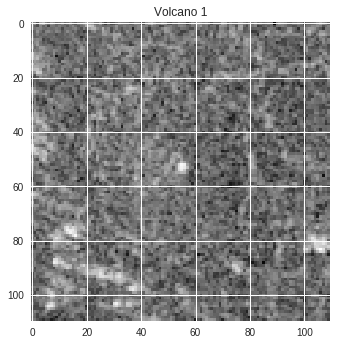

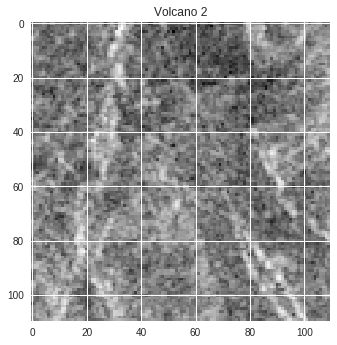

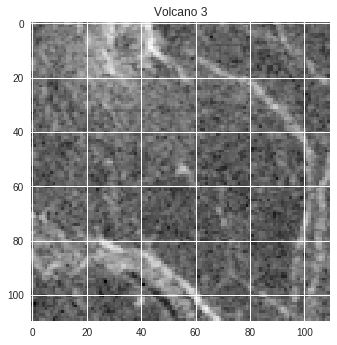

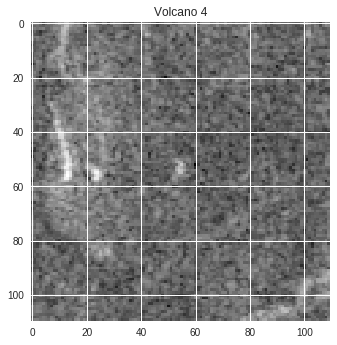

...

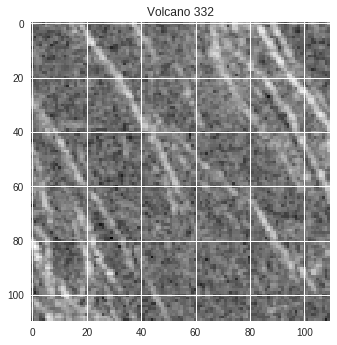

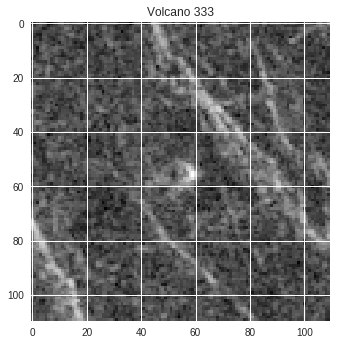

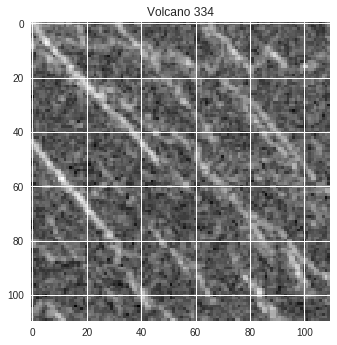

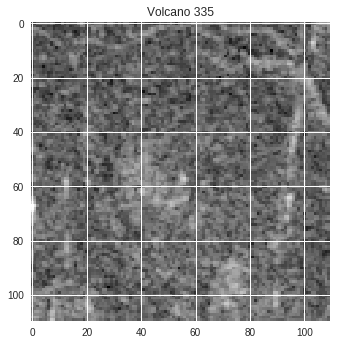

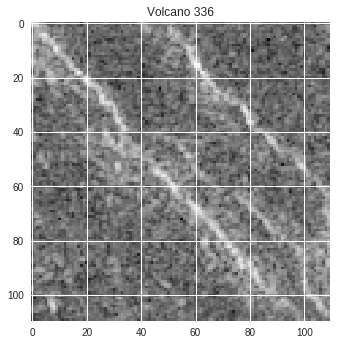

In [38]:
detected = test_images[(total_pred['Volcano?'] == 1)]

for x in range(detected.shape[0]):
    image_flat = np.array(detected.iloc[x])
    image = image_flat.reshape((110,110))

    plt.figure()
    plt.imshow(image,cmap='gray')
    plt.title('Volcano '+str(x))

plt.show()